In [1]:
!pip install segmentation_models

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 4.4 MB/s eta 0:00:00


## Importing Dependencies

In [2]:
import tensorflow as tf
#import segmentation_models as sm
import glob
import cv2
import os
import numpy as np
from matplotlib import pyplot as plt
import keras 
from sklearn.model_selection import train_test_split
import albumentations as A
import glob

In [3]:
from tensorflow.keras.layers import Input, Conv2D, LeakyReLU, BatchNormalization, Activation, MaxPool2D, UpSampling2D, Concatenate, Dropout, Conv2DTranspose, Multiply, ReLU, Add
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras import models , layers
from keras.initializers import RandomNormal
from keras import backend as K
from tensorflow.keras.optimizers import Adam

In [4]:
from random import randint

## Initial Convolutional Layer

In [5]:
def conv1b(inp,f):
    q = Conv2D(f, 1,(1,1),'valid', use_bias = False)(inp)
    return q

In [6]:
def conv3b(inp,f):
    e = Conv2D(f,3,(1,1),"same",use_bias = False)(inp)
    return e 

In [7]:
def resblock(inp,f):
    inp = Conv2D(f,1, use_bias = False)(inp)
    inp = Activation("LeakyReLU")(inp)
    inp = Conv2D(f, 3, strides=(1,1), padding ='same', use_bias = False , dilation_rate=(2, 2))(inp)
    inp = Activation("LeakyReLU")(inp)
    inp = Conv2D(f, 1, use_bias = False)(inp)
    inp = Activation("LeakyReLU")(inp)
    return inp

In [8]:
def irnn(inp):
    _,H,W,_ = tf.shape(inp)
    tleft = tf.identity(inp)
    tright = tf.identity(inp)
    tup = tf.identity(inp)
    tdown = tf.identity(inp)
    lw = Conv2D(32,1,(1,1),'valid', groups = 32)(inp)
    rw = Conv2D(32,1,(1,1),'valid', groups = 32)(inp)   
    uw = Conv2D(32,1,(1,1),'valid', groups = 32)(inp)
    dw = Conv2D(32,1,(1,1),'valid', groups = 32)(inp)
    tleftlist = []
    trightlist = []
    tuplist = []
    tdownlist = []
    tleftlist.append(tf.math.add(lw[:,:,:W,:], inp[:,:,:,:1]))
    tleft = tf.stack(tleftlist)
    tleft = tf.squeeze(tleft, axis = 0)
    trightlist.append(tf.math.add(rw[:,:,0:,:], inp[:,:,:W,:1]))
    tright = tf.stack(trightlist)
    tright = tf.squeeze(tright, axis = 0)
    tuplist.append(tf.math.add(uw[:,:H,:,:], inp[:,0:,:,:1]))
    tup = tf.stack(tuplist)
    tup = tf.squeeze(tup, axis = 0)
    tdownlist.append(tf.math.add(uw[:,0:,:,:], inp[:,:H,:,:1]))
    tdown = tf.stack(tdownlist)
    tdown = tf.squeeze(tdown, axis = 0)
    tleft = Activation("LeakyReLU")(tleft)
    tright = Activation("LeakyReLU")(tright)
    tup = Activation("LeakyReLU")(tup)
    tdown = Activation("LeakyReLU")(tdown)
    return tleft, tright, tup, tdown


In [9]:
def attention(x,f):
    inp = Conv2D(f, 3,(1,1),'same')(x)
    inp = Activation("LeakyReLU")(inp)
    inp = Conv2D(f, 3,(1,1),'same')(inp)
    inp = Activation("LeakyReLU")(inp)
    inp = Conv2D(f, 1,(1,1),'valid')(inp)
    inp = Activation("LeakyReLU")(inp)
    return inp

In [10]:
def SAM (x,f):
    attention_layer = attention(x,f)
    x = Conv2D(f,1,(1,1),'valid')(x)
    tleft, tright, tup, tdown = irnn(x)
    if attention:
        x1 = Multiply()([tup,attention_layer[:,:,:,0:1]])
        x2 = Multiply()([tright,attention_layer[:,:,:,1:2]])
        x3 = Multiply()([tdown,attention_layer[:,:,:,2:3]])
        x4 = Multiply()([tleft,attention_layer[:,:,:,3:4]])
    x = Concatenate()([x1,x2,x3,x4])
    x = Conv2D(f*4,1,(1,1),'valid')(x)
    x = irnn(x)
    if attention:
        x1 = Multiply()([tup,attention_layer[:,:,:,0:1]])
        x2 = Multiply()([tright,attention_layer[:,:,:,1:2]])
        x3 = Multiply()([tdown,attention_layer[:,:,:,2:3]])
        x4 = Multiply()([tleft,attention_layer[:,:,:,3:4]])
    x = Concatenate()([x1,x2,x3,x4])
    x = Conv2D(f*4,1,(1,1), 'valid')(x)
    x = Activation('LeakyReLU')(x)
    x = tf.keras.activations.sigmoid(conv1b(x,32))
    return x

In [11]:
def Spa_gen(image_shape):
    in_image = tf.keras.Input(image_shape, 1)
    
    x = conv3b(in_image,32)
    
    
    x = Activation("LeakyReLU")(x)
    
    res_block1= resblock(x,32)
    
    x = Activation('LeakyReLU')(res_block1+x)
    res_block2= resblock(x,32)
    x = tf.keras.layers.LeakyReLU()(res_block2+x)
    
    
    res_block3= resblock(x,32)
    x = tf.keras.layers.LeakyReLU()(res_block3+x)
    
    
    #print(tf.shape(x))
    attention1 = SAM(x,32) 
    
    res_block4= resblock(x,32)
    x = tf.keras.layers.LeakyReLU()(res_block4*attention1+x)  
    res_block5= resblock(x,32)
    
    x = tf.keras.layers.LeakyReLU()(res_block5*attention1+x)
    res_block6= resblock(x,32)
    
    x = tf.keras.layers.LeakyReLU()(res_block6*attention1+x)
    
    attention2 = SAM(x,32)
    res_block7= resblock(x,32)
    
    x = tf.keras.layers.LeakyReLU()(res_block7*attention2+x)
    res_block8= resblock(x,32)
    
    x = tf.keras.layers.LeakyReLU()(res_block8*attention2+x)
    res_block9= resblock(x,32)
    
    x = tf.keras.layers.LeakyReLU()(res_block9*attention2+x)
    attention3 = SAM(x,32)
    
    res_block10= resblock(x,32)
    x = tf.keras.layers.LeakyReLU()(res_block10*attention3+x)
    
    res_block11= resblock(x,32)
    x = tf.keras.layers.LeakyReLU()(res_block11*attention3+x)
    
    res_block12= resblock(x,32)
    x = tf.keras.layers.LeakyReLU()(res_block1*attention3+x)
    
    attention4 = SAM(x,32)

    res_block13= resblock(x,32)
    x = tf.keras.layers.LeakyReLU()(res_block13*attention4+x)
    
    res_block14= resblock(x,32)
    x = tf.keras.layers.LeakyReLU()(res_block14*attention4+x)
    
    res_block15= resblock(x,32)
    x = tf.keras.layers.LeakyReLU()(res_block15*attention4+x)
    
    res_block16= resblock(x,32)
    x = tf.keras.layers.LeakyReLU()(res_block16+x)
    
    res_block17= resblock(x,32)
    
    x = tf.keras.layers.LeakyReLU()(res_block17+x)
    x = Conv2D(3,3,(1,1),'same', use_bias = False)(x)
    
    
    return Model(in_image, x)

In [12]:
def discriminator(image_shape):
    init = RandomNormal(stddev=0.02)
    source_image = Input(shape=image_shape)
    gen_image = Input(shape=image_shape) #image produced from generator
    join = Concatenate()([source_image,gen_image]) #concatenate images channel-wise
    # Block 1: input is 512 x 512 x (3)
    x = layers.Conv2D(64, kernel_size=4, strides= 2, padding='same', kernel_initializer=init, name='conv_1')(join)
    x = layers.LeakyReLU(0.2, name='leaky_relu_1')(x)
    # Block 2: input is 256 x 256 x (64)
    x = layers.Conv2D(128, 4, 2, 'same', kernel_initializer=init, name='conv_2')(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(0.2, name='leaky_relu_2')(x)
    # Block 3: input is 64 x 64 x (128)
    x = layers.Conv2D(256, 4, 2, 'same', kernel_initializer=init, name='conv_3')(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(0.2, name='leaky_relu_3')(x)
    # Block 4: input is 32 x 32 x (256)
    x = layers.Conv2D(512, 4, 2, 'same', kernel_initializer=init, name='conv_4')(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(0.2, name='leaky_relu_4')(x)
    # Block 5: input is 16 x 16 x (512)
    outputs = layers.Conv2D(1, 4, 2, 'same', kernel_initializer=init, activation='sigmoid', name='conv_5')(x)
    # Output: 1 x 1 x 1
    #define model
    model = Model([source_image,gen_image], outputs)
    opt = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt, loss_weights=[0.5])
    return model

In [13]:
def call_GAN(g_model, d_model, image_shape):
    d_model.trainable = False
    sourc_image = Input(shape=image_shape) 
    gen_out = g_model(sourc_image)
    print(gen_out)
    dis_out = d_model([sourc_image, gen_out])
    model = Model(sourc_image, [dis_out, gen_out])
    opt = Adam(learning_rate=0.00002, beta_1=0.5)
    model.compile(loss=['binary_crossentropy', 'mae'], optimizer=opt, loss_weights=[1,100])
    return model

In [6]:
trainlistpath = '/kaggle/input/spagaan/RICE_DATASET/RICE1/train_list.txt'
trainlistn = os.path.join(trainlistpath)
trainlistlnk = open(trainlistpath)
trainlist = trainlistlnk.read()
trainlist = trainlist.split('\n')
del trainlist[-1]

In [7]:
testlistpath = '/kaggle/input/spagaan/RICE_DATASET/RICE1/test_list.txt'
testlistn = os.path.join(testlistpath)
testlistlnk = open(testlistn)
testlist = testlistlnk.read()
testlist = testlist.split("\n")
del testlist[-1]

(512, 512, 3)


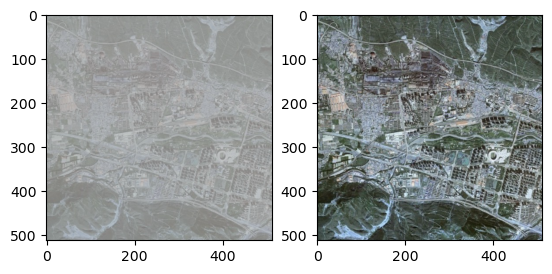

In [8]:
cloudypath = '/kaggle/input/spagaan/RICE_DATASET/RICE1/cloudy_image/'
groundtruthpath = '/kaggle/input/spagaan/RICE_DATASET/RICE1/ground_truth'
traincloud = [os.path.join(cloudypath,x) for x in trainlist]
traingroundtruth = [os.path.join(groundtruthpath,x) for x in trainlist]
pic = cv2.imread(traincloud[13])
pic1 = cv2.imread(traingroundtruth[13])
image_shape = pic1.shape
print(image_shape)
plt.subplot(1,2,1)
plt.imshow(pic)
plt.subplot(1,2,2)
plt.imshow(pic1)

In [17]:
def datapreprocesstest(c,g):
    #tc = []
    #tg = []
    fc = glob.glob(c)
    fg = glob.glob(g)
    #for f1 in fc:
    Im =cv2.imread(str(c)).astype(np.float32)
    Im = Im[np.newaxis, :, :, :]
        #tc.append(Im)
    #for f2 in fg:
    Ig = cv2.imread(str(g)).astype(np.float32)
    Ig = Ig[np.newaxis, :, :, :]
        #tg.append(Ig)    
    Imm = Im/255
    Igg = Ig/255
    #tc = Imm.transpose(2,0,1)
    #tg = Igg.transpose(2,0,1)
    
    return Imm, Igg

In [18]:
batchsize = 1
tg = []
tm = []
for i in range(400):
    
    dataset = datapreprocesstest(traincloud[i], traingroundtruth[i])
    tg.append(dataset[0])
    tm.append(dataset[1])

In [19]:
def tf_dataset(traincloud, traingroundtruth,x):
    BUFFER_SIZE = 5000
    BATCH_SIZE = x
    print(tf.rank(traincloud))

# Batch and shuffle the data
    traincloud = tf.data.Dataset.from_tensor_slices(traincloud)
    print(traincloud)
    traingroundtruth = tf.data.Dataset.from_tensor_slices(traingroundtruth)
    print(traingroundtruth)
    return traincloud, traingroundtruth

In [20]:
def generate_real_samples(dataset, n_samples, patch_shape):
    global X1
    global X2
    #X1 =0
    #X2 = 0
    trainA, trainB = dataset
    l = len(trainA)
    ix = randint(0, l)
    c = 0
    for i in trainA:
        if c == ix:
            X1 = i
        else:
            c+=1
    h =0
    for j in trainB:
        if h == ix:
            X2 = j
        else:
            h+=1
    
    
    y = np.ones((n_samples, patch_shape, patch_shape, 1))
    return [X1, X2], y

In [21]:
def generate_fake_samples(g_model, samples, patch_shape):
    X = g_model.predict(samples)
    y = np.zeros((len(X), patch_shape, patch_shape, 1))
    return X, y

In [22]:
def summarize_performance(step, g_model, dataset, n_samples=3): 
    [X_realA, X_realB], _ = generate_real_samples(dataset, n_samples, 1)
    X_fakeB, _ = generate_fake_samples(g_model, X_realA, 1)
    X_realA = (X_realA + 1) / 2.0
    X_realB = (X_realB + 1) / 2.0
    X_fakeB = (X_fakeB + 1) / 2.0
    
    for i in range(1):
        plt.subplot(1, n_samples, 1)
        plt.axis('off')
        plt.imshow(X_realA[i])
        plt.show()
    
    for i in range(1):
        plt.subplot(1, n_samples, 2)
        plt.axis('off')
        plt.imshow(X_fakeB[i])
        plt.show()
        
    for i in range(1):
        plt.subplot(1, n_samples, 3)
        plt.axis('off')
        plt.imshow(X_realB[i])
        plt.show()

    filename1 = 'plot_%06d.png' % (step+1)
    plt.savefig(filename1)
    plt.close()
  
    filename2 = 'model_%06d.h5' % (step+1)
    g_model.save(filename2)
    print('>Saved: %s and %s' % (filename1, filename2))

In [23]:
def train(d_model, g_model, gan_model, dataset, n_epochs=500, n_batch=1):
    n_patch = d_model.output_shape[1]
    trainA, trainB = dataset
    #bat_per_epo = int(len(trainA) / n_batch)
    #n_steps = bat_per_epo * n_epochs
    n_steps = 1500
    d_loss1_log = []
    d_loss2_log = []
    g_loss_log = []
    SSIM_log = []
    for i in range(n_steps):
        [X_realA, X_realB], y_real = generate_real_samples(dataset, n_batch, n_patch)
        X_fakeB, y_fake = generate_fake_samples(g_model, X_realA, n_patch)
        d_loss1 = d_model.train_on_batch([X_realA, X_realB], y_real)
        d_loss1_log.append(d_loss1)
        d_loss2 = d_model.train_on_batch([X_realA, X_fakeB], y_fake)
        d_loss2_log.append(d_loss2)
        g_loss, _, _ = gan_model.train_on_batch(X_realA, [y_real, X_realB])
        g_loss_log.append(g_loss)
        ssim = tf.image.ssim(X_realA, X_fakeB, max_val=1.0, filter_size=11,
                          filter_sigma=1.5, k1=0.01, k2=0.03)
        SSIM_log.append(ssim)

        plt.clf()
        plt.figure(figsize=(20,12))
        plt.title('Epoch:%d, d1[%.3f] d2[%.3f] g[%.3f] ssim[%.3f]' % (i+1, d_loss1, d_loss2, g_loss, ssim))
        plt.xlabel('Epoch', fontsize=16)
        plt.ylabel('Loss', fontsize=16)
        plt.plot(d_loss1_log, 'r-', lw=2, label='d_loss1')
        plt.plot(d_loss2_log, 'b-', lw=1, label='d_loss2')
        plt.plot(g_loss_log, 'g-', lw=1, label='g_loss')
        
        plt.legend(prop={'size':16}, loc="upper right")
        #plt.show()
        #display.clear_output(wait=True)
        #display.display(plt.gcf())
        print('>%d, d1[%.3f] d2[%.3f] g[%.3f] ssim[%.3f]' % (i+1, d_loss1, d_loss2, g_loss, ssim))
        if (i+1) % 50 == 0:
            plt.savefig('./loss_graph_%06d.jpg' % (i+1), bbox_inches='tight')
            summarize_performance(i, g_model, dataset)

tf.Tensor(5, shape=(), dtype=int32)
<TensorSliceDataset element_spec=TensorSpec(shape=(1, 512, 512, 3), dtype=tf.float32, name=None)>
<TensorSliceDataset element_spec=TensorSpec(shape=(1, 512, 512, 3), dtype=tf.float32, name=None)>
Dataset loaded
(<TensorSliceDataset element_spec=TensorSpec(shape=(1, 512, 512, 3), dtype=tf.float32, name=None)>, <TensorSliceDataset element_spec=TensorSpec(shape=(1, 512, 512, 3), dtype=tf.float32, name=None)>)


/opt/conda/lib/python3.7/site-packages/keras/initializers/initializers_v2.py:121: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values  each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  f"The initializer {self.__class__.__name__} is unseeded "


KerasTensor(type_spec=TensorSpec(shape=(1, 512, 512, 3), dtype=tf.float32, name=None), name='model_1/conv2d_112/Conv2D:0', description="created by layer 'model_1'")
1/1 [==============================] - 9s 9s/step
>1, d1[0.388] d2[0.714] g[54.159] ssim[0.427]
1/1 [==============================] - 0s 37ms/step
>2, d1[0.388] d2[0.469] g[51.282] ssim[0.424]
1/1 [==============================] - 0s 36ms/step
>3, d1[0.141] d2[0.209] g[48.814] ssim[0.420]
1/1 [==============================] - 0s 35ms/step
>4, d1[0.066] d2[0.057] g[46.799] ssim[0.414]
1/1 [==============================] - 0s 35ms/step
>5, d1[0.045] d2[0.032] g[45.161] ssim[0.407]
1/1 [==============================] - 0s 35ms/step
>6, d1[0.032] d2[0.022] g[43.799] ssim[0.399]
1/1 [==============================] - 0s 36ms/step
>7, d1[0.024] d2[0.017] g[42.622] ssim[0.393]
1/1 [==============================] - 0s 36ms/step
>8, d1[0.019] d2[0.015] g[41.546] ssim[0.388]
1/1 [==============================] - 0s 34ms/step
>

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


>20, d1[0.005] d2[0.005] g[30.188] ssim[0.351]
1/1 [==============================] - 0s 37ms/step
>21, d1[0.005] d2[0.005] g[29.309] ssim[0.346]
1/1 [==============================] - 0s 33ms/step
>22, d1[0.004] d2[0.005] g[28.437] ssim[0.342]
1/1 [==============================] - 0s 34ms/step
>23, d1[0.004] d2[0.005] g[27.574] ssim[0.338]
1/1 [==============================] - 0s 35ms/step
>24, d1[0.004] d2[0.004] g[26.722] ssim[0.334]
1/1 [==============================] - 0s 36ms/step
>25, d1[0.004] d2[0.004] g[25.878] ssim[0.329]
1/1 [==============================] - 0s 36ms/step
>26, d1[0.003] d2[0.004] g[25.039] ssim[0.325]
1/1 [==============================] - 0s 35ms/step
>27, d1[0.003] d2[0.004] g[24.205] ssim[0.321]
1/1 [==============================] - 0s 35ms/step
>28, d1[0.003] d2[0.004] g[23.373] ssim[0.318]
1/1 [==============================] - 0s 34ms/step
>29, d1[0.003] d2[0.004] g[22.541] ssim[0.315]
1/1 [==============================] - 0s 33ms/step
>30, d1[0.

<Figure size 640x480 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

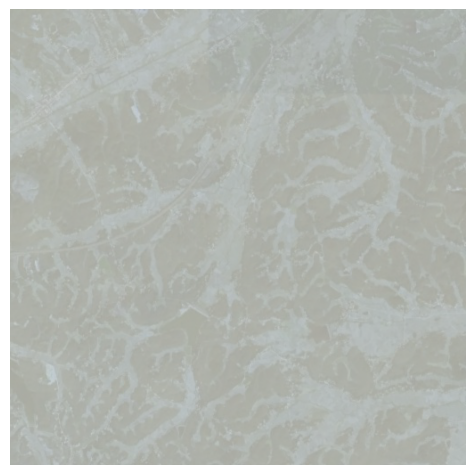

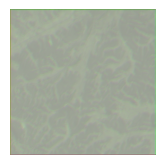

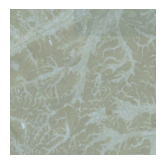

>Saved: plot_000050.png and model_000050.h5
1/1 [==============================] - 0s 36ms/step
>51, d1[0.002] d2[0.002] g[8.293] ssim[0.622]
1/1 [==============================] - 0s 35ms/step
>52, d1[0.002] d2[0.002] g[8.299] ssim[0.627]
1/1 [==============================] - 0s 34ms/step
>53, d1[0.002] d2[0.002] g[8.310] ssim[0.630]
1/1 [==============================] - 0s 33ms/step
>54, d1[0.002] d2[0.002] g[8.323] ssim[0.634]
1/1 [==============================] - 0s 33ms/step
>55, d1[0.002] d2[0.001] g[8.338] ssim[0.636]
1/1 [==============================] - 0s 34ms/step
>56, d1[0.002] d2[0.001] g[8.354] ssim[0.639]
1/1 [==============================] - 0s 36ms/step
>57, d1[0.002] d2[0.001] g[8.371] ssim[0.641]
1/1 [==============================] - 0s 33ms/step
>58, d1[0.001] d2[0.001] g[8.389] ssim[0.643]
1/1 [==============================] - 0s 36ms/step
>59, d1[0.001] d2[0.001] g[8.407] ssim[0.645]
1/1 [==============================] - 0s 37ms/step
>60, d1[0.001] d2[0.00

<Figure size 640x480 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

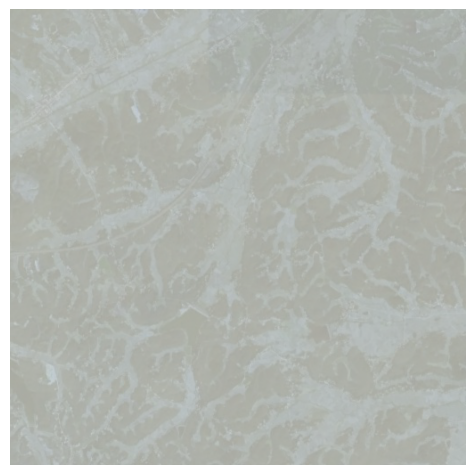

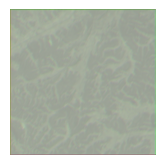

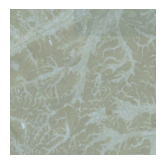

>Saved: plot_000100.png and model_000100.h5
1/1 [==============================] - 0s 36ms/step
>101, d1[0.000] d2[0.000] g[9.175] ssim[0.686]
1/1 [==============================] - 0s 34ms/step
>102, d1[0.000] d2[0.000] g[9.191] ssim[0.687]
1/1 [==============================] - 0s 34ms/step
>103, d1[0.000] d2[0.000] g[9.206] ssim[0.688]
1/1 [==============================] - 0s 35ms/step
>104, d1[0.000] d2[0.000] g[9.222] ssim[0.688]
1/1 [==============================] - 0s 34ms/step
>105, d1[0.000] d2[0.000] g[9.237] ssim[0.689]
1/1 [==============================] - 0s 37ms/step
>106, d1[0.000] d2[0.000] g[9.252] ssim[0.690]
1/1 [==============================] - 0s 35ms/step
>107, d1[0.000] d2[0.000] g[9.267] ssim[0.690]
1/1 [==============================] - 0s 35ms/step
>108, d1[0.000] d2[0.000] g[9.282] ssim[0.691]
1/1 [==============================] - 0s 33ms/step
>109, d1[0.000] d2[0.000] g[9.296] ssim[0.692]
1/1 [==============================] - 0s 35ms/step
>110, d1[0.00

<Figure size 640x480 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

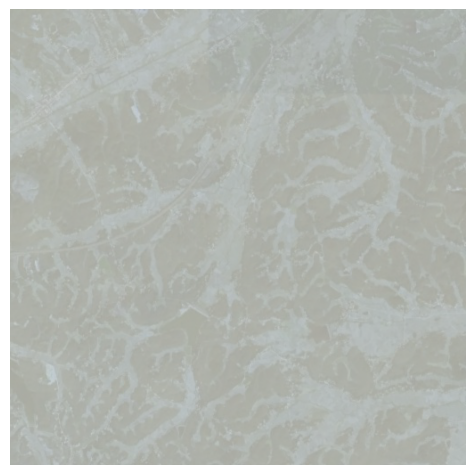

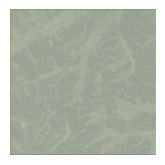

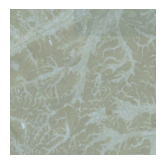

>Saved: plot_000150.png and model_000150.h5
1/1 [==============================] - 0s 34ms/step
>151, d1[0.000] d2[0.000] g[9.751] ssim[0.721]
1/1 [==============================] - 0s 33ms/step
>152, d1[0.000] d2[0.000] g[9.760] ssim[0.721]
1/1 [==============================] - 0s 35ms/step
>153, d1[0.000] d2[0.000] g[9.768] ssim[0.721]
1/1 [==============================] - 0s 34ms/step
>154, d1[0.000] d2[0.000] g[9.776] ssim[0.722]
1/1 [==============================] - 0s 38ms/step
>155, d1[0.000] d2[0.000] g[9.784] ssim[0.722]
1/1 [==============================] - 0s 35ms/step
>156, d1[0.000] d2[0.000] g[9.792] ssim[0.723]
1/1 [==============================] - 0s 33ms/step
>157, d1[0.000] d2[0.000] g[9.800] ssim[0.723]
1/1 [==============================] - 0s 34ms/step
>158, d1[0.000] d2[0.000] g[9.807] ssim[0.723]
1/1 [==============================] - 0s 35ms/step
>159, d1[0.000] d2[0.000] g[9.815] ssim[0.724]
1/1 [==============================] - 0s 34ms/step
>160, d1[0.00

<Figure size 640x480 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

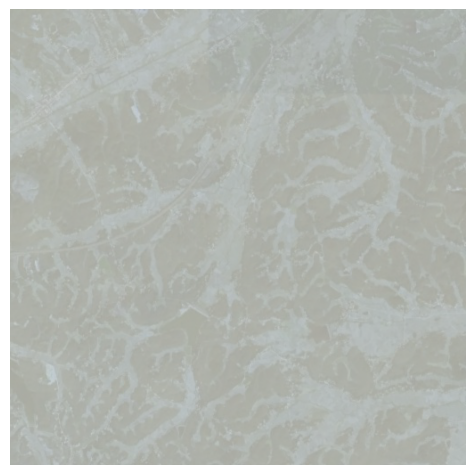

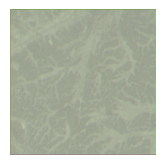

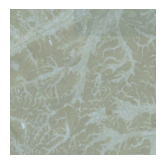

>Saved: plot_000200.png and model_000200.h5
1/1 [==============================] - 0s 36ms/step
>201, d1[0.000] d2[0.000] g[10.048] ssim[0.729]
1/1 [==============================] - 0s 35ms/step
>202, d1[0.000] d2[0.000] g[10.050] ssim[0.729]
1/1 [==============================] - 0s 32ms/step
>203, d1[0.000] d2[0.000] g[10.052] ssim[0.729]
1/1 [==============================] - 0s 36ms/step
>204, d1[0.000] d2[0.000] g[10.053] ssim[0.729]
1/1 [==============================] - 0s 37ms/step
>205, d1[0.000] d2[0.000] g[10.054] ssim[0.729]
1/1 [==============================] - 0s 33ms/step
>206, d1[0.000] d2[0.000] g[10.056] ssim[0.729]
1/1 [==============================] - 0s 34ms/step
>207, d1[0.000] d2[0.000] g[10.058] ssim[0.728]
1/1 [==============================] - 0s 36ms/step
>208, d1[0.000] d2[0.000] g[10.060] ssim[0.728]
1/1 [==============================] - 0s 32ms/step
>209, d1[0.000] d2[0.000] g[10.062] ssim[0.728]
1/1 [==============================] - 0s 36ms/step
>210

<Figure size 640x480 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

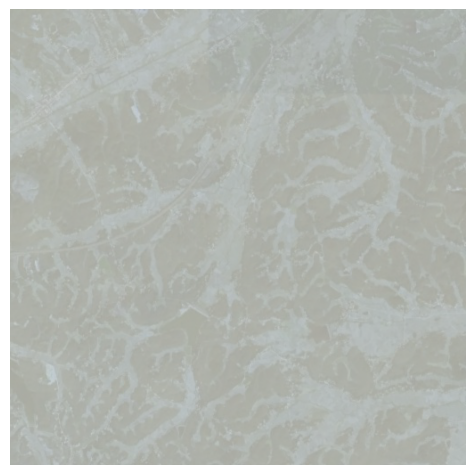

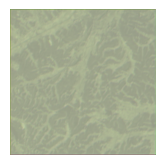

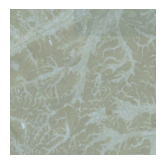

>Saved: plot_000250.png and model_000250.h5
1/1 [==============================] - 0s 35ms/step
>251, d1[0.000] d2[0.000] g[10.505] ssim[0.698]
1/1 [==============================] - 0s 33ms/step
>252, d1[0.000] d2[0.000] g[10.525] ssim[0.696]
1/1 [==============================] - 0s 34ms/step
>253, d1[0.000] d2[0.000] g[10.545] ssim[0.693]
1/1 [==============================] - 0s 34ms/step
>254, d1[0.000] d2[0.000] g[10.566] ssim[0.689]
1/1 [==============================] - 0s 33ms/step
>255, d1[0.000] d2[0.000] g[10.587] ssim[0.684]
1/1 [==============================] - 0s 33ms/step
>256, d1[0.000] d2[0.000] g[10.608] ssim[0.679]
1/1 [==============================] - 0s 37ms/step
>257, d1[0.000] d2[0.000] g[10.628] ssim[0.672]
1/1 [==============================] - 0s 34ms/step
>258, d1[0.000] d2[0.000] g[10.648] ssim[0.664]
1/1 [==============================] - 0s 38ms/step
>259, d1[0.000] d2[0.000] g[10.669] ssim[0.653]
1/1 [==============================] - 0s 39ms/step
>260

<Figure size 640x480 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

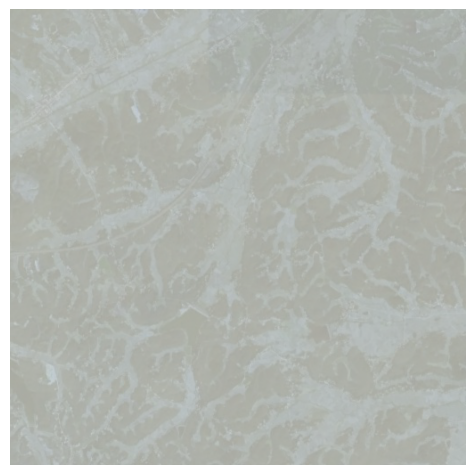

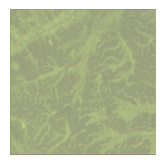

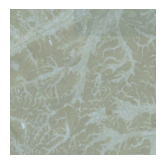

>Saved: plot_000300.png and model_000300.h5
1/1 [==============================] - 0s 33ms/step
>301, d1[0.000] d2[0.000] g[10.957] ssim[0.538]
1/1 [==============================] - 0s 34ms/step
>302, d1[0.000] d2[0.000] g[10.931] ssim[0.543]
1/1 [==============================] - 0s 34ms/step
>303, d1[0.000] d2[0.000] g[10.927] ssim[0.537]
1/1 [==============================] - 0s 35ms/step
>304, d1[0.000] d2[0.000] g[10.931] ssim[0.547]
1/1 [==============================] - 0s 39ms/step
>305, d1[0.000] d2[0.000] g[10.997] ssim[0.536]
1/1 [==============================] - 0s 34ms/step
>306, d1[0.000] d2[0.000] g[11.081] ssim[0.552]
1/1 [==============================] - 0s 36ms/step
>307, d1[0.000] d2[0.000] g[11.174] ssim[0.538]
1/1 [==============================] - 0s 38ms/step
>308, d1[0.000] d2[0.000] g[11.097] ssim[0.557]
1/1 [==============================] - 0s 54ms/step
>309, d1[0.000] d2[0.000] g[10.914] ssim[0.542]
1/1 [==============================] - 0s 33ms/step
>310

<Figure size 640x480 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

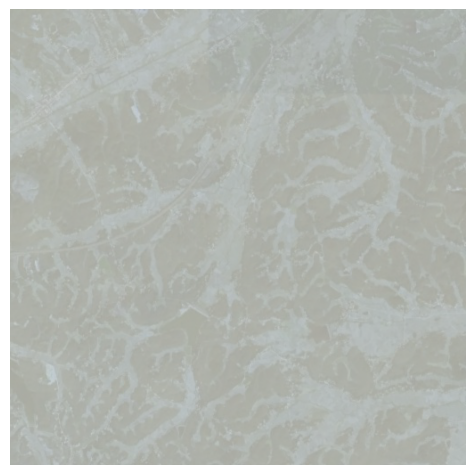

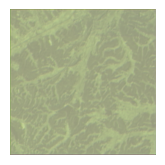

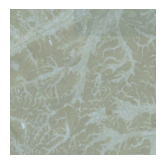

>Saved: plot_000350.png and model_000350.h5
1/1 [==============================] - 0s 36ms/step
>351, d1[0.000] d2[0.000] g[9.054] ssim[0.597]
1/1 [==============================] - 0s 35ms/step
>352, d1[0.000] d2[0.000] g[8.963] ssim[0.620]
1/1 [==============================] - 0s 35ms/step
>353, d1[0.000] d2[0.000] g[9.006] ssim[0.599]
1/1 [==============================] - 0s 35ms/step
>354, d1[0.000] d2[0.000] g[8.902] ssim[0.623]
1/1 [==============================] - 0s 36ms/step
>355, d1[0.000] d2[0.000] g[8.945] ssim[0.601]
1/1 [==============================] - 0s 36ms/step
>356, d1[0.000] d2[0.000] g[8.826] ssim[0.626]
1/1 [==============================] - 0s 35ms/step
>357, d1[0.000] d2[0.000] g[8.871] ssim[0.604]
1/1 [==============================] - 0s 36ms/step
>358, d1[0.000] d2[0.000] g[8.754] ssim[0.628]
1/1 [==============================] - 0s 35ms/step
>359, d1[0.000] d2[0.000] g[8.810] ssim[0.607]
1/1 [==============================] - 0s 36ms/step
>360, d1[0.00

<Figure size 640x480 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

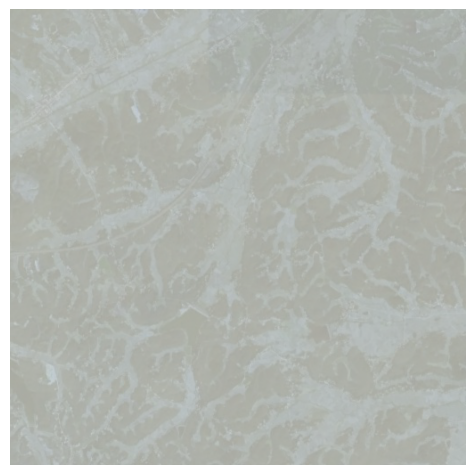

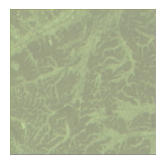

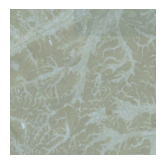

>Saved: plot_000400.png and model_000400.h5
1/1 [==============================] - 0s 39ms/step
>401, d1[0.000] d2[0.000] g[7.783] ssim[0.646]
1/1 [==============================] - 0s 35ms/step
>402, d1[0.000] d2[0.000] g[7.644] ssim[0.667]
1/1 [==============================] - 0s 36ms/step
>403, d1[0.000] d2[0.000] g[7.759] ssim[0.648]
1/1 [==============================] - 0s 34ms/step
>404, d1[0.000] d2[0.000] g[7.611] ssim[0.668]
1/1 [==============================] - 0s 47ms/step
>405, d1[0.000] d2[0.000] g[7.724] ssim[0.649]
1/1 [==============================] - 0s 48ms/step
>406, d1[0.000] d2[0.000] g[7.573] ssim[0.670]
1/1 [==============================] - 0s 34ms/step
>407, d1[0.000] d2[0.000] g[7.684] ssim[0.651]
1/1 [==============================] - 0s 37ms/step
>408, d1[0.000] d2[0.000] g[7.538] ssim[0.671]
1/1 [==============================] - 0s 34ms/step
>409, d1[0.000] d2[0.000] g[7.660] ssim[0.652]
1/1 [==============================] - 0s 34ms/step
>410, d1[0.00

<Figure size 640x480 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

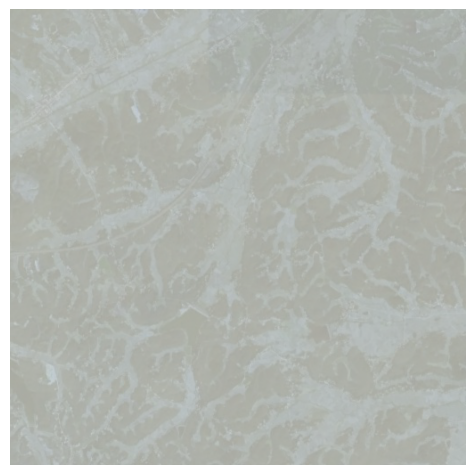

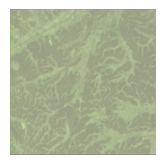

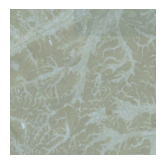

>Saved: plot_000450.png and model_000450.h5
1/1 [==============================] - 0s 35ms/step
>451, d1[0.000] d2[0.000] g[7.266] ssim[0.667]
1/1 [==============================] - 0s 34ms/step
>452, d1[0.000] d2[0.000] g[7.132] ssim[0.684]
1/1 [==============================] - 0s 33ms/step
>453, d1[0.000] d2[0.000] g[7.252] ssim[0.668]
1/1 [==============================] - 0s 34ms/step
>454, d1[0.000] d2[0.000] g[7.122] ssim[0.685]
1/1 [==============================] - 0s 35ms/step
>455, d1[0.000] d2[0.000] g[7.249] ssim[0.668]
1/1 [==============================] - 0s 34ms/step
>456, d1[0.000] d2[0.000] g[7.113] ssim[0.685]
1/1 [==============================] - 0s 32ms/step
>457, d1[0.000] d2[0.000] g[7.236] ssim[0.668]
1/1 [==============================] - 0s 38ms/step
>458, d1[0.000] d2[0.000] g[7.102] ssim[0.685]
1/1 [==============================] - 0s 36ms/step
>459, d1[0.000] d2[0.000] g[7.218] ssim[0.669]
1/1 [==============================] - 0s 34ms/step
>460, d1[0.00

<Figure size 640x480 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

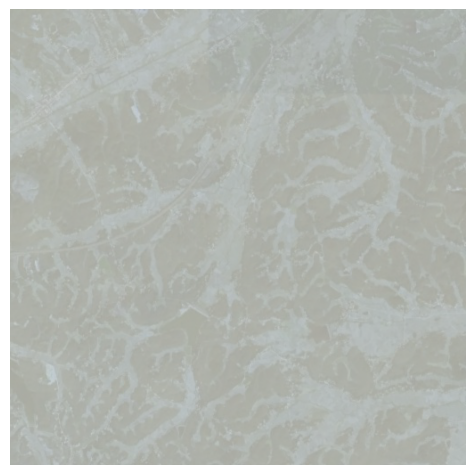

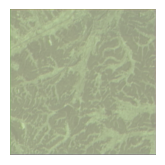

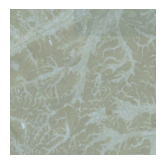

>Saved: plot_000500.png and model_000500.h5
1/1 [==============================] - 0s 34ms/step
>501, d1[0.000] d2[0.000] g[7.041] ssim[0.674]
1/1 [==============================] - 0s 51ms/step
>502, d1[0.000] d2[0.000] g[6.932] ssim[0.689]
1/1 [==============================] - 0s 35ms/step
>503, d1[0.000] d2[0.000] g[7.042] ssim[0.675]
1/1 [==============================] - 0s 41ms/step
>504, d1[0.000] d2[0.000] g[6.924] ssim[0.690]
1/1 [==============================] - 0s 33ms/step
>505, d1[0.000] d2[0.000] g[7.026] ssim[0.675]
1/1 [==============================] - 0s 36ms/step
>506, d1[0.000] d2[0.000] g[6.916] ssim[0.690]
1/1 [==============================] - 0s 36ms/step
>507, d1[0.000] d2[0.000] g[7.026] ssim[0.675]
1/1 [==============================] - 0s 34ms/step
>508, d1[0.000] d2[0.000] g[6.910] ssim[0.690]
1/1 [==============================] - 0s 34ms/step
>509, d1[0.000] d2[0.000] g[7.020] ssim[0.675]
1/1 [==============================] - 0s 34ms/step
>510, d1[0.00

<Figure size 640x480 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

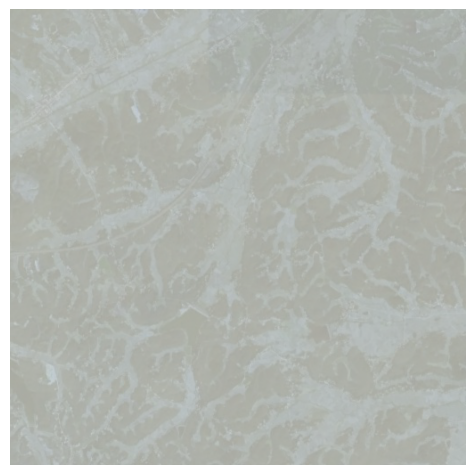

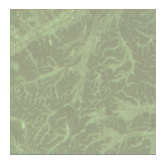

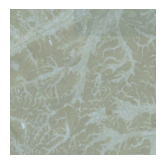

>Saved: plot_000550.png and model_000550.h5
1/1 [==============================] - 0s 44ms/step
>551, d1[0.000] d2[0.000] g[6.845] ssim[0.682]
1/1 [==============================] - 0s 44ms/step
>552, d1[0.000] d2[0.000] g[6.739] ssim[0.695]
1/1 [==============================] - 0s 33ms/step
>553, d1[0.000] d2[0.000] g[6.832] ssim[0.682]
1/1 [==============================] - 0s 34ms/step
>554, d1[0.000] d2[0.000] g[6.730] ssim[0.695]
1/1 [==============================] - 0s 36ms/step
>555, d1[0.000] d2[0.000] g[6.828] ssim[0.682]
1/1 [==============================] - 0s 33ms/step
>556, d1[0.000] d2[0.000] g[6.725] ssim[0.695]
1/1 [==============================] - 0s 36ms/step
>557, d1[0.000] d2[0.000] g[6.822] ssim[0.682]
1/1 [==============================] - 0s 35ms/step
>558, d1[0.000] d2[0.000] g[6.718] ssim[0.695]
1/1 [==============================] - 0s 35ms/step
>559, d1[0.000] d2[0.000] g[6.809] ssim[0.682]
1/1 [==============================] - 0s 33ms/step
>560, d1[0.00

<Figure size 640x480 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

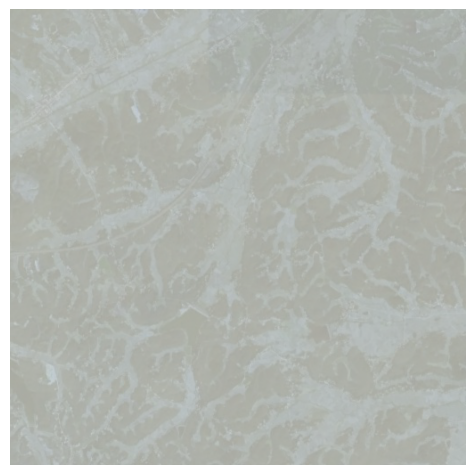

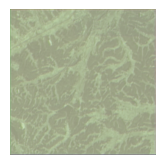

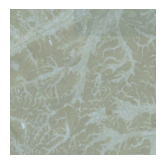

>Saved: plot_000600.png and model_000600.h5
1/1 [==============================] - 0s 37ms/step
>601, d1[0.000] d2[0.000] g[6.714] ssim[0.685]
1/1 [==============================] - 0s 37ms/step
>602, d1[0.000] d2[0.000] g[6.628] ssim[0.696]
1/1 [==============================] - 0s 38ms/step
>603, d1[0.000] d2[0.000] g[6.706] ssim[0.685]
1/1 [==============================] - 0s 38ms/step
>604, d1[0.000] d2[0.000] g[6.620] ssim[0.696]
1/1 [==============================] - 0s 38ms/step
>605, d1[0.000] d2[0.000] g[6.695] ssim[0.685]
1/1 [==============================] - 0s 36ms/step
>606, d1[0.000] d2[0.000] g[6.615] ssim[0.696]
1/1 [==============================] - 0s 38ms/step
>607, d1[0.000] d2[0.000] g[6.693] ssim[0.686]
1/1 [==============================] - 0s 48ms/step
>608, d1[0.000] d2[0.000] g[6.612] ssim[0.696]
1/1 [==============================] - 0s 53ms/step
>609, d1[0.000] d2[0.000] g[6.687] ssim[0.686]
1/1 [==============================] - 0s 35ms/step
>610, d1[0.00

<Figure size 640x480 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

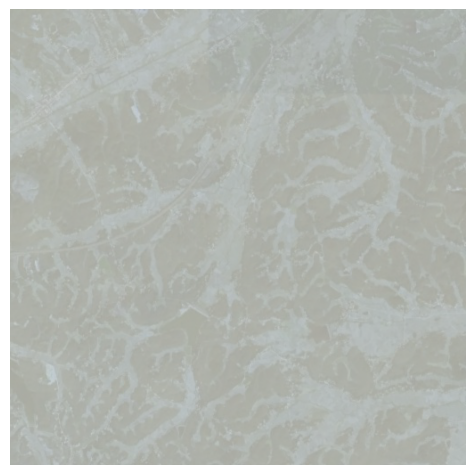

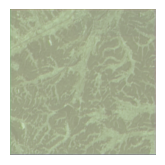

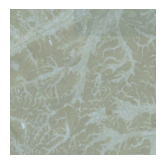

>Saved: plot_000650.png and model_000650.h5
1/1 [==============================] - 0s 35ms/step
>651, d1[0.000] d2[0.000] g[6.628] ssim[0.686]
1/1 [==============================] - 0s 34ms/step
>652, d1[0.000] d2[0.000] g[6.572] ssim[0.695]
1/1 [==============================] - 0s 34ms/step
>653, d1[0.000] d2[0.000] g[6.625] ssim[0.686]
1/1 [==============================] - 0s 35ms/step
>654, d1[0.000] d2[0.000] g[6.566] ssim[0.695]
1/1 [==============================] - 0s 36ms/step
>655, d1[0.000] d2[0.000] g[6.615] ssim[0.686]
1/1 [==============================] - 0s 34ms/step
>656, d1[0.000] d2[0.000] g[6.556] ssim[0.695]
1/1 [==============================] - 0s 34ms/step
>657, d1[0.000] d2[0.000] g[6.600] ssim[0.687]
1/1 [==============================] - 0s 34ms/step
>658, d1[0.000] d2[0.000] g[6.544] ssim[0.695]
1/1 [==============================] - 0s 37ms/step
>659, d1[0.000] d2[0.000] g[6.590] ssim[0.687]
1/1 [==============================] - 0s 35ms/step
>660, d1[0.00

<Figure size 640x480 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

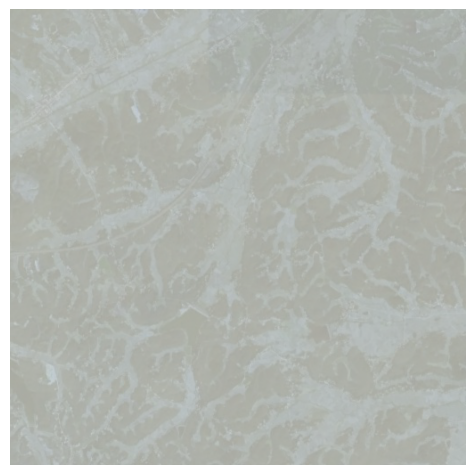

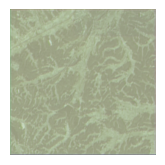

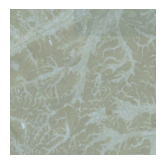

>Saved: plot_000700.png and model_000700.h5
1/1 [==============================] - 0s 35ms/step
>701, d1[0.000] d2[0.000] g[6.478] ssim[0.687]
1/1 [==============================] - 0s 42ms/step
>702, d1[0.000] d2[0.000] g[6.436] ssim[0.695]
1/1 [==============================] - 0s 34ms/step
>703, d1[0.000] d2[0.000] g[6.472] ssim[0.687]
1/1 [==============================] - 0s 37ms/step
>704, d1[0.000] d2[0.000] g[6.431] ssim[0.695]
1/1 [==============================] - 0s 35ms/step
>705, d1[0.000] d2[0.000] g[6.472] ssim[0.686]
1/1 [==============================] - 0s 35ms/step
>706, d1[0.000] d2[0.000] g[6.429] ssim[0.695]
1/1 [==============================] - 0s 34ms/step
>707, d1[0.000] d2[0.000] g[6.468] ssim[0.687]
1/1 [==============================] - 0s 35ms/step
>708, d1[0.000] d2[0.000] g[6.420] ssim[0.695]
1/1 [==============================] - 0s 35ms/step
>709, d1[0.000] d2[0.000] g[6.452] ssim[0.687]
1/1 [==============================] - 0s 37ms/step
>710, d1[0.00

<Figure size 640x480 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

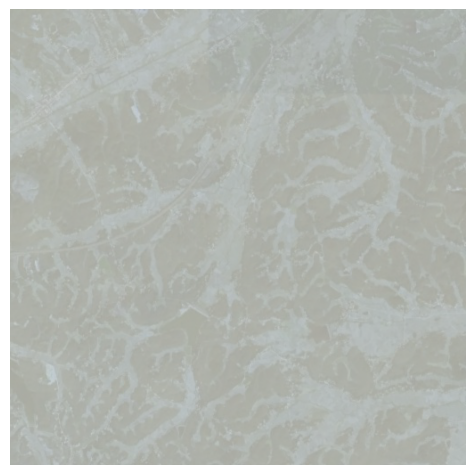

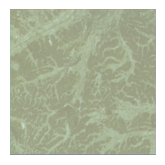

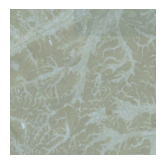

>Saved: plot_000750.png and model_000750.h5
1/1 [==============================] - 0s 34ms/step
>751, d1[0.000] d2[0.000] g[6.398] ssim[0.687]
1/1 [==============================] - 0s 36ms/step
>752, d1[0.000] d2[0.000] g[6.378] ssim[0.691]
1/1 [==============================] - 0s 56ms/step
>753, d1[0.000] d2[0.000] g[6.401] ssim[0.688]
1/1 [==============================] - 0s 37ms/step
>754, d1[0.000] d2[0.000] g[6.386] ssim[0.691]
1/1 [==============================] - 0s 34ms/step
>755, d1[0.000] d2[0.000] g[6.413] ssim[0.687]
1/1 [==============================] - 0s 36ms/step
>756, d1[0.000] d2[0.000] g[6.400] ssim[0.690]
1/1 [==============================] - 0s 37ms/step
>757, d1[0.000] d2[0.000] g[6.425] ssim[0.686]
1/1 [==============================] - 0s 36ms/step
>758, d1[0.000] d2[0.000] g[6.404] ssim[0.690]
1/1 [==============================] - 0s 33ms/step
>759, d1[0.000] d2[0.000] g[6.423] ssim[0.686]
1/1 [==============================] - 0s 34ms/step
>760, d1[0.00

<Figure size 640x480 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

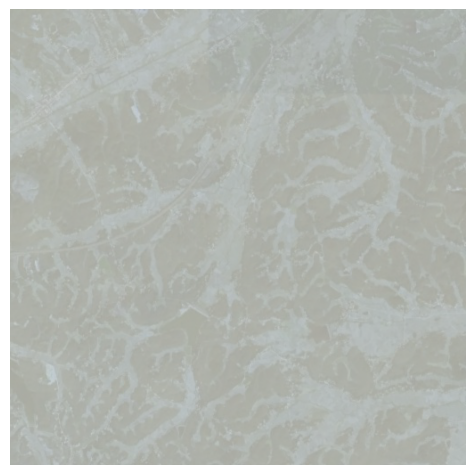

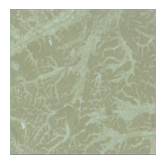

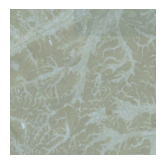

>Saved: plot_000800.png and model_000800.h5
1/1 [==============================] - 0s 34ms/step
>801, d1[0.000] d2[0.000] g[6.648] ssim[0.676]
1/1 [==============================] - 0s 34ms/step
>802, d1[0.000] d2[0.000] g[6.670] ssim[0.676]
1/1 [==============================] - 0s 36ms/step
>803, d1[0.000] d2[0.000] g[6.695] ssim[0.675]
1/1 [==============================] - 0s 34ms/step
>804, d1[0.000] d2[0.000] g[6.718] ssim[0.675]
1/1 [==============================] - 0s 35ms/step
>805, d1[0.000] d2[0.000] g[6.743] ssim[0.675]
1/1 [==============================] - 0s 36ms/step
>806, d1[0.000] d2[0.000] g[6.777] ssim[0.674]
1/1 [==============================] - 0s 36ms/step
>807, d1[0.000] d2[0.000] g[6.820] ssim[0.673]
1/1 [==============================] - 0s 34ms/step
>808, d1[0.000] d2[0.000] g[6.852] ssim[0.672]
1/1 [==============================] - 0s 34ms/step
>809, d1[0.000] d2[0.000] g[6.903] ssim[0.671]
1/1 [==============================] - 0s 34ms/step
>810, d1[0.00

<Figure size 640x480 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

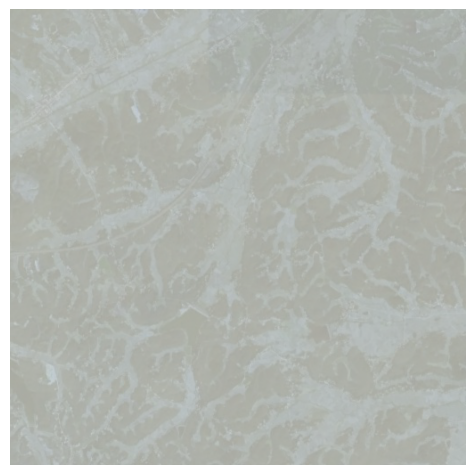

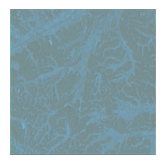

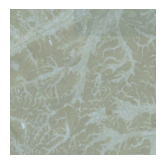

>Saved: plot_000850.png and model_000850.h5
1/1 [==============================] - 0s 39ms/step
>851, d1[0.003] d2[0.008] g[17.122] ssim[0.339]
1/1 [==============================] - 0s 42ms/step
>852, d1[0.003] d2[0.007] g[16.097] ssim[0.366]
1/1 [==============================] - 0s 40ms/step
>853, d1[0.003] d2[0.007] g[15.062] ssim[0.394]
1/1 [==============================] - 0s 40ms/step
>854, d1[0.003] d2[0.007] g[14.018] ssim[0.421]
1/1 [==============================] - 0s 36ms/step
>855, d1[0.003] d2[0.007] g[12.977] ssim[0.449]
1/1 [==============================] - 0s 41ms/step
>856, d1[0.003] d2[0.007] g[11.972] ssim[0.477]
1/1 [==============================] - 0s 36ms/step
>857, d1[0.003] d2[0.007] g[11.059] ssim[0.503]
1/1 [==============================] - 0s 37ms/step
>858, d1[0.003] d2[0.007] g[10.287] ssim[0.528]
1/1 [==============================] - 0s 37ms/step
>859, d1[0.003] d2[0.007] g[9.642] ssim[0.554]
1/1 [==============================] - 0s 38ms/step
>860,

<Figure size 640x480 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

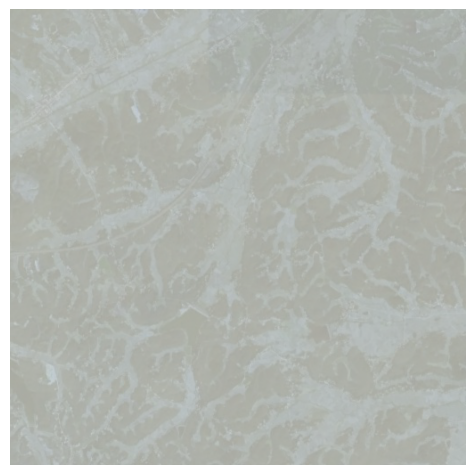

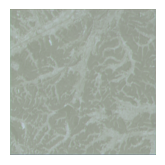

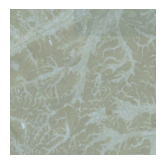

>Saved: plot_000900.png and model_000900.h5
1/1 [==============================] - 0s 33ms/step
>901, d1[0.002] d2[0.004] g[4.004] ssim[0.793]
1/1 [==============================] - 0s 33ms/step
>902, d1[0.002] d2[0.004] g[4.017] ssim[0.792]
1/1 [==============================] - 0s 36ms/step
>903, d1[0.002] d2[0.004] g[4.029] ssim[0.792]
1/1 [==============================] - 0s 36ms/step
>904, d1[0.001] d2[0.004] g[4.041] ssim[0.792]
1/1 [==============================] - 0s 34ms/step
>905, d1[0.001] d2[0.004] g[4.052] ssim[0.791]
1/1 [==============================] - 0s 34ms/step
>906, d1[0.001] d2[0.003] g[4.063] ssim[0.791]
1/1 [==============================] - 0s 33ms/step
>907, d1[0.001] d2[0.003] g[4.073] ssim[0.790]
1/1 [==============================] - 0s 34ms/step
>908, d1[0.001] d2[0.003] g[4.083] ssim[0.790]
1/1 [==============================] - 0s 34ms/step
>909, d1[0.001] d2[0.003] g[4.091] ssim[0.790]
1/1 [==============================] - 0s 34ms/step
>910, d1[0.00

<Figure size 640x480 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

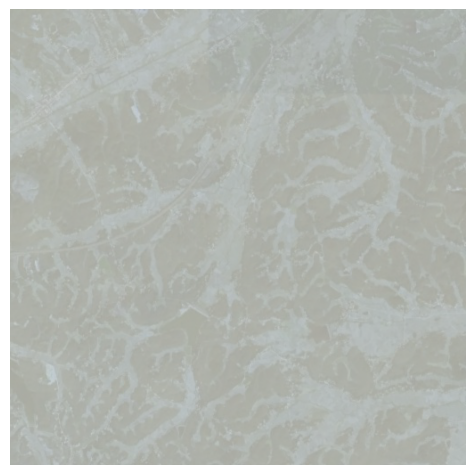

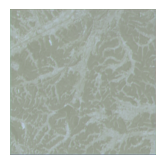

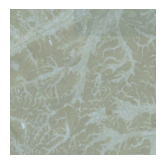

>Saved: plot_000950.png and model_000950.h5
1/1 [==============================] - 0s 38ms/step
>951, d1[0.001] d2[0.002] g[4.398] ssim[0.774]
1/1 [==============================] - 0s 35ms/step
>952, d1[0.001] d2[0.001] g[4.411] ssim[0.773]
1/1 [==============================] - 0s 37ms/step
>953, d1[0.001] d2[0.001] g[4.424] ssim[0.773]
1/1 [==============================] - 0s 37ms/step
>954, d1[0.001] d2[0.001] g[4.438] ssim[0.773]
1/1 [==============================] - 0s 39ms/step
>955, d1[0.001] d2[0.001] g[4.453] ssim[0.773]
1/1 [==============================] - 0s 34ms/step
>956, d1[0.001] d2[0.001] g[4.468] ssim[0.772]
1/1 [==============================] - 0s 52ms/step
>957, d1[0.001] d2[0.001] g[4.484] ssim[0.772]
1/1 [==============================] - 0s 35ms/step
>958, d1[0.001] d2[0.001] g[4.500] ssim[0.772]
1/1 [==============================] - 0s 35ms/step
>959, d1[0.001] d2[0.001] g[4.516] ssim[0.772]
1/1 [==============================] - 0s 37ms/step
>960, d1[0.00

<Figure size 640x480 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

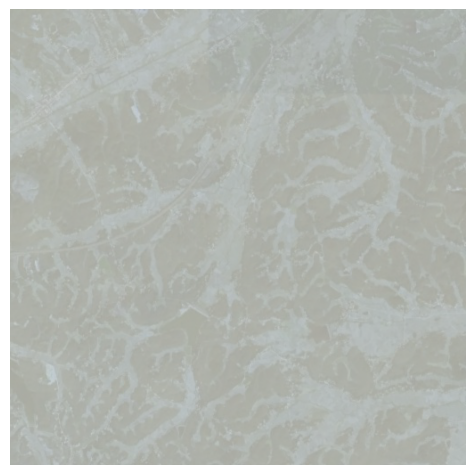

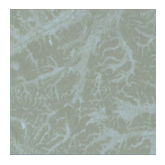

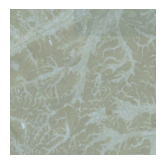

>Saved: plot_001000.png and model_001000.h5
1/1 [==============================] - 0s 34ms/step
>1001, d1[0.000] d2[0.001] g[5.378] ssim[0.759]
1/1 [==============================] - 0s 36ms/step
>1002, d1[0.000] d2[0.001] g[5.400] ssim[0.758]
1/1 [==============================] - 0s 34ms/step
>1003, d1[0.000] d2[0.001] g[5.421] ssim[0.758]
1/1 [==============================] - 0s 34ms/step
>1004, d1[0.000] d2[0.001] g[5.443] ssim[0.758]
1/1 [==============================] - 0s 33ms/step
>1005, d1[0.000] d2[0.001] g[5.464] ssim[0.757]
1/1 [==============================] - 0s 34ms/step
>1006, d1[0.000] d2[0.001] g[5.486] ssim[0.757]
1/1 [==============================] - 0s 34ms/step
>1007, d1[0.000] d2[0.001] g[5.507] ssim[0.757]
1/1 [==============================] - 0s 32ms/step
>1008, d1[0.000] d2[0.001] g[5.529] ssim[0.756]
1/1 [==============================] - 0s 34ms/step
>1009, d1[0.000] d2[0.001] g[5.550] ssim[0.756]
1/1 [==============================] - 0s 33ms/step
>101

<Figure size 640x480 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

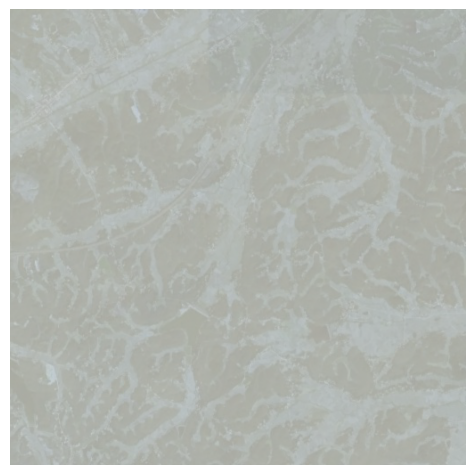

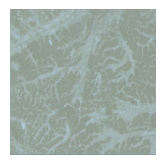

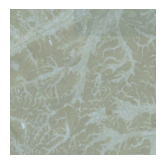

>Saved: plot_001050.png and model_001050.h5
1/1 [==============================] - 0s 34ms/step
>1051, d1[0.000] d2[0.001] g[6.303] ssim[0.743]
1/1 [==============================] - 0s 36ms/step
>1052, d1[0.000] d2[0.001] g[6.318] ssim[0.742]
1/1 [==============================] - 0s 35ms/step
>1053, d1[0.000] d2[0.001] g[6.332] ssim[0.742]
1/1 [==============================] - 0s 36ms/step
>1054, d1[0.000] d2[0.001] g[6.347] ssim[0.742]
1/1 [==============================] - 0s 38ms/step
>1055, d1[0.000] d2[0.001] g[6.362] ssim[0.741]
1/1 [==============================] - 0s 35ms/step
>1056, d1[0.000] d2[0.001] g[6.376] ssim[0.741]
1/1 [==============================] - 0s 57ms/step
>1057, d1[0.000] d2[0.001] g[6.391] ssim[0.741]
1/1 [==============================] - 0s 64ms/step
>1058, d1[0.000] d2[0.001] g[6.405] ssim[0.741]
1/1 [==============================] - 0s 36ms/step
>1059, d1[0.000] d2[0.001] g[6.419] ssim[0.740]
1/1 [==============================] - 0s 35ms/step
>106

<Figure size 640x480 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

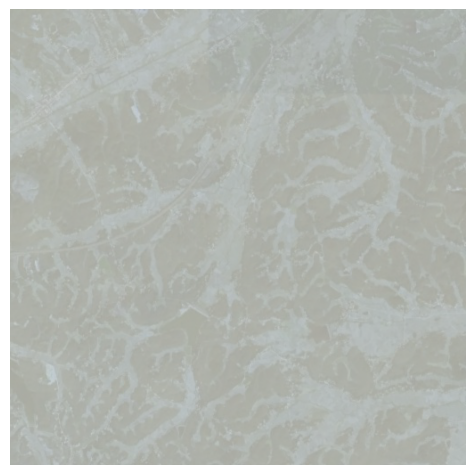

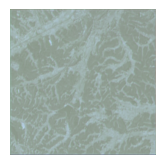

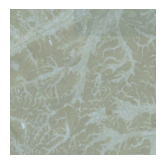

>Saved: plot_001100.png and model_001100.h5
1/1 [==============================] - 0s 38ms/step
>1101, d1[0.000] d2[0.000] g[6.920] ssim[0.732]
1/1 [==============================] - 0s 48ms/step
>1102, d1[0.000] d2[0.000] g[6.929] ssim[0.732]
1/1 [==============================] - 0s 36ms/step
>1103, d1[0.000] d2[0.000] g[6.939] ssim[0.731]
1/1 [==============================] - 0s 36ms/step
>1104, d1[0.000] d2[0.000] g[6.948] ssim[0.731]
1/1 [==============================] - 0s 35ms/step
>1105, d1[0.000] d2[0.000] g[6.958] ssim[0.731]
1/1 [==============================] - 0s 34ms/step
>1106, d1[0.000] d2[0.000] g[6.967] ssim[0.731]
1/1 [==============================] - 0s 61ms/step
>1107, d1[0.000] d2[0.000] g[6.976] ssim[0.731]
1/1 [==============================] - 0s 37ms/step
>1108, d1[0.000] d2[0.000] g[6.986] ssim[0.731]
1/1 [==============================] - 0s 38ms/step
>1109, d1[0.000] d2[0.000] g[6.994] ssim[0.731]
1/1 [==============================] - 0s 37ms/step
>111

<Figure size 640x480 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

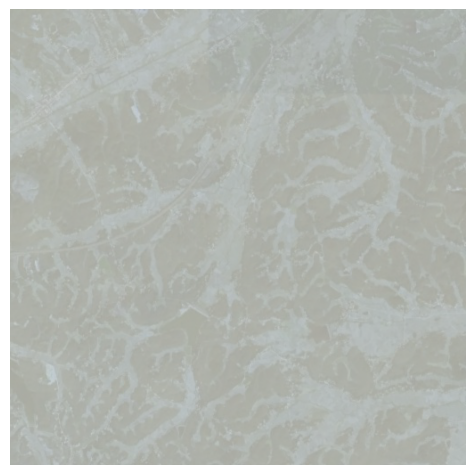

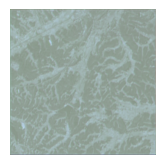

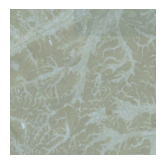

>Saved: plot_001150.png and model_001150.h5
1/1 [==============================] - 0s 36ms/step
>1151, d1[0.000] d2[0.000] g[7.313] ssim[0.726]
1/1 [==============================] - 0s 34ms/step
>1152, d1[0.000] d2[0.000] g[7.319] ssim[0.726]
1/1 [==============================] - 0s 34ms/step
>1153, d1[0.000] d2[0.000] g[7.326] ssim[0.726]
1/1 [==============================] - 0s 37ms/step
>1154, d1[0.000] d2[0.000] g[7.332] ssim[0.726]
1/1 [==============================] - 0s 35ms/step
>1155, d1[0.000] d2[0.000] g[7.338] ssim[0.726]
1/1 [==============================] - 0s 46ms/step
>1156, d1[0.000] d2[0.000] g[7.344] ssim[0.726]
1/1 [==============================] - 0s 34ms/step
>1157, d1[0.000] d2[0.000] g[7.350] ssim[0.726]
1/1 [==============================] - 0s 35ms/step
>1158, d1[0.000] d2[0.000] g[7.356] ssim[0.726]
1/1 [==============================] - 0s 35ms/step
>1159, d1[0.000] d2[0.000] g[7.362] ssim[0.726]
1/1 [==============================] - 0s 35ms/step
>116

<Figure size 640x480 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

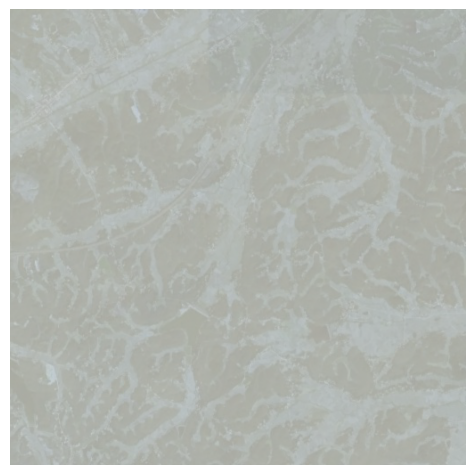

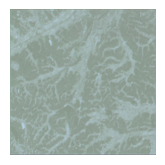

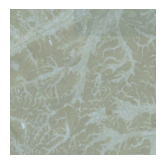

>Saved: plot_001200.png and model_001200.h5
1/1 [==============================] - 0s 36ms/step
>1201, d1[0.000] d2[0.000] g[7.523] ssim[0.726]
1/1 [==============================] - 0s 36ms/step
>1202, d1[0.000] d2[0.000] g[7.526] ssim[0.726]
1/1 [==============================] - 0s 36ms/step
>1203, d1[0.000] d2[0.000] g[7.529] ssim[0.726]
1/1 [==============================] - 0s 36ms/step
>1204, d1[0.000] d2[0.000] g[7.532] ssim[0.726]
1/1 [==============================] - 0s 37ms/step
>1205, d1[0.000] d2[0.000] g[7.535] ssim[0.726]
1/1 [==============================] - 0s 36ms/step
>1206, d1[0.000] d2[0.000] g[7.538] ssim[0.726]
1/1 [==============================] - 0s 35ms/step
>1207, d1[0.000] d2[0.000] g[7.541] ssim[0.726]
1/1 [==============================] - 0s 35ms/step
>1208, d1[0.000] d2[0.000] g[7.544] ssim[0.726]
1/1 [==============================] - 0s 36ms/step
>1209, d1[0.000] d2[0.000] g[7.547] ssim[0.726]
1/1 [==============================] - 0s 36ms/step
>121

<Figure size 640x480 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

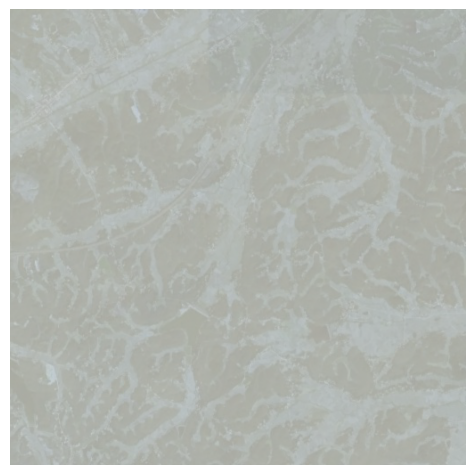

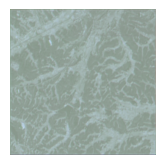

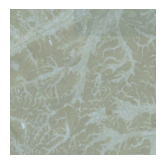

>Saved: plot_001250.png and model_001250.h5
1/1 [==============================] - 0s 34ms/step
>1251, d1[0.000] d2[0.000] g[7.616] ssim[0.727]
1/1 [==============================] - 0s 35ms/step
>1252, d1[0.000] d2[0.000] g[7.617] ssim[0.727]
1/1 [==============================] - 0s 35ms/step
>1253, d1[0.000] d2[0.000] g[7.619] ssim[0.727]
1/1 [==============================] - 0s 50ms/step
>1254, d1[0.000] d2[0.000] g[7.621] ssim[0.727]
1/1 [==============================] - 0s 35ms/step
>1255, d1[0.000] d2[0.000] g[7.623] ssim[0.727]
1/1 [==============================] - 0s 36ms/step
>1256, d1[0.000] d2[0.000] g[7.625] ssim[0.727]
1/1 [==============================] - 0s 35ms/step
>1257, d1[0.000] d2[0.000] g[7.626] ssim[0.727]
1/1 [==============================] - 0s 34ms/step
>1258, d1[0.000] d2[0.000] g[7.628] ssim[0.727]
1/1 [==============================] - 0s 37ms/step
>1259, d1[0.000] d2[0.000] g[7.629] ssim[0.727]
1/1 [==============================] - 0s 34ms/step
>126

<Figure size 640x480 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

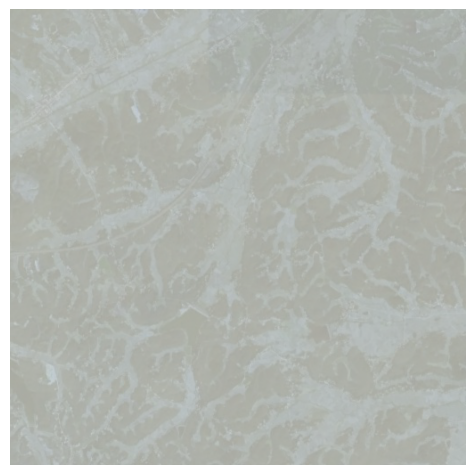

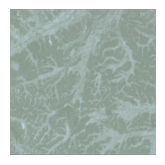

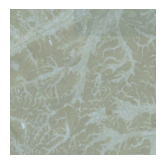

>Saved: plot_001300.png and model_001300.h5
1/1 [==============================] - 0s 36ms/step
>1301, d1[0.000] d2[0.000] g[7.688] ssim[0.727]
1/1 [==============================] - 0s 49ms/step
>1302, d1[0.000] d2[0.000] g[7.690] ssim[0.727]
1/1 [==============================] - 0s 36ms/step
>1303, d1[0.000] d2[0.000] g[7.692] ssim[0.727]
1/1 [==============================] - 0s 35ms/step
>1304, d1[0.000] d2[0.000] g[7.694] ssim[0.727]
1/1 [==============================] - 0s 34ms/step
>1305, d1[0.000] d2[0.000] g[7.696] ssim[0.727]
1/1 [==============================] - 0s 35ms/step
>1306, d1[0.000] d2[0.000] g[7.699] ssim[0.727]
1/1 [==============================] - 0s 35ms/step
>1307, d1[0.000] d2[0.000] g[7.701] ssim[0.727]
1/1 [==============================] - 0s 35ms/step
>1308, d1[0.000] d2[0.000] g[7.703] ssim[0.727]
1/1 [==============================] - 0s 37ms/step
>1309, d1[0.000] d2[0.000] g[7.705] ssim[0.727]
1/1 [==============================] - 0s 34ms/step
>131

<Figure size 640x480 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

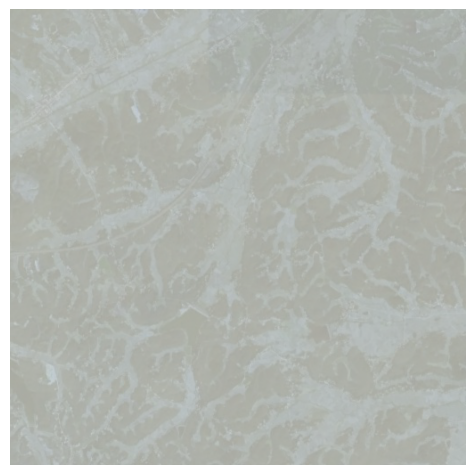

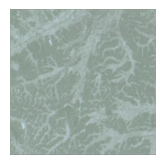

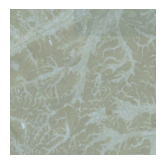

>Saved: plot_001350.png and model_001350.h5
1/1 [==============================] - 0s 47ms/step
>1351, d1[0.000] d2[0.000] g[7.812] ssim[0.725]
1/1 [==============================] - 0s 37ms/step
>1352, d1[0.000] d2[0.000] g[7.814] ssim[0.724]
1/1 [==============================] - 0s 34ms/step
>1353, d1[0.000] d2[0.000] g[7.817] ssim[0.724]
1/1 [==============================] - 0s 33ms/step
>1354, d1[0.000] d2[0.000] g[7.820] ssim[0.724]
1/1 [==============================] - 0s 36ms/step
>1355, d1[0.000] d2[0.000] g[7.822] ssim[0.724]
1/1 [==============================] - 0s 34ms/step
>1356, d1[0.000] d2[0.000] g[7.825] ssim[0.724]
1/1 [==============================] - 0s 33ms/step
>1357, d1[0.000] d2[0.000] g[7.828] ssim[0.724]
1/1 [==============================] - 0s 51ms/step
>1358, d1[0.000] d2[0.000] g[7.830] ssim[0.724]
1/1 [==============================] - 0s 34ms/step
>1359, d1[0.000] d2[0.000] g[7.833] ssim[0.724]
1/1 [==============================] - 0s 34ms/step
>136

<Figure size 640x480 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

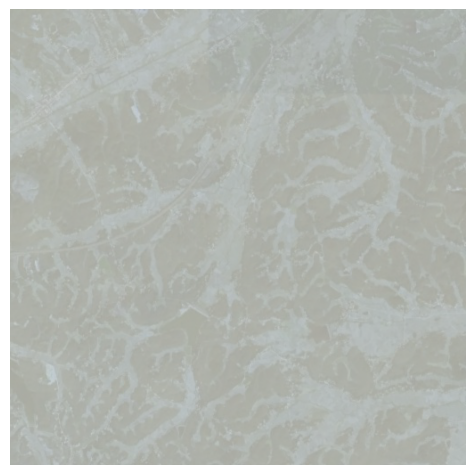

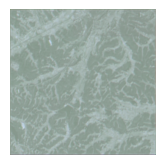

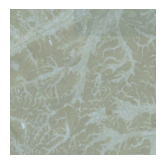

>Saved: plot_001400.png and model_001400.h5
1/1 [==============================] - 0s 34ms/step
>1401, d1[0.000] d2[0.000] g[7.932] ssim[0.720]
1/1 [==============================] - 0s 37ms/step
>1402, d1[0.000] d2[0.000] g[7.934] ssim[0.720]
1/1 [==============================] - 0s 34ms/step
>1403, d1[0.000] d2[0.000] g[7.936] ssim[0.720]
1/1 [==============================] - 0s 35ms/step
>1404, d1[0.000] d2[0.000] g[7.938] ssim[0.720]
1/1 [==============================] - 0s 34ms/step
>1405, d1[0.000] d2[0.000] g[7.940] ssim[0.720]
1/1 [==============================] - 0s 36ms/step
>1406, d1[0.000] d2[0.000] g[7.942] ssim[0.720]
1/1 [==============================] - 0s 36ms/step
>1407, d1[0.000] d2[0.000] g[7.944] ssim[0.720]
1/1 [==============================] - 0s 65ms/step
>1408, d1[0.000] d2[0.000] g[7.946] ssim[0.720]
1/1 [==============================] - 0s 34ms/step
>1409, d1[0.000] d2[0.000] g[7.947] ssim[0.719]
1/1 [==============================] - 0s 33ms/step
>141

<Figure size 640x480 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

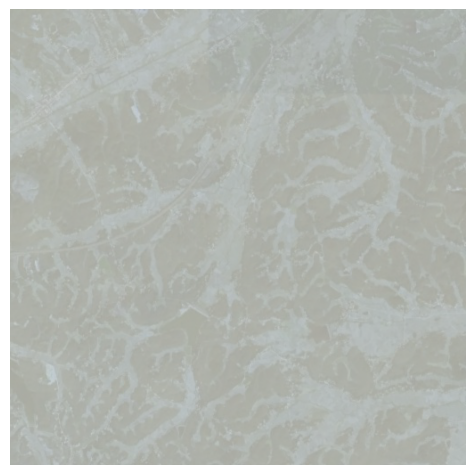

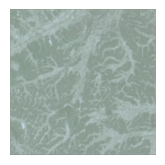

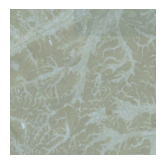

>Saved: plot_001450.png and model_001450.h5
1/1 [==============================] - 0s 36ms/step
>1451, d1[0.000] d2[0.000] g[8.022] ssim[0.715]
1/1 [==============================] - 0s 38ms/step
>1452, d1[0.000] d2[0.000] g[8.023] ssim[0.715]
1/1 [==============================] - 0s 38ms/step
>1453, d1[0.000] d2[0.000] g[8.025] ssim[0.715]
1/1 [==============================] - 0s 39ms/step
>1454, d1[0.000] d2[0.000] g[8.027] ssim[0.715]
1/1 [==============================] - 0s 36ms/step
>1455, d1[0.000] d2[0.000] g[8.028] ssim[0.715]
1/1 [==============================] - 0s 37ms/step
>1456, d1[0.000] d2[0.000] g[8.030] ssim[0.715]
1/1 [==============================] - 0s 37ms/step
>1457, d1[0.000] d2[0.000] g[8.032] ssim[0.715]
1/1 [==============================] - 0s 35ms/step
>1458, d1[0.000] d2[0.000] g[8.033] ssim[0.715]
1/1 [==============================] - 0s 69ms/step
>1459, d1[0.000] d2[0.000] g[8.035] ssim[0.715]
1/1 [==============================] - 0s 36ms/step
>146

<Figure size 640x480 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

<Figure size 2000x1200 with 0 Axes>

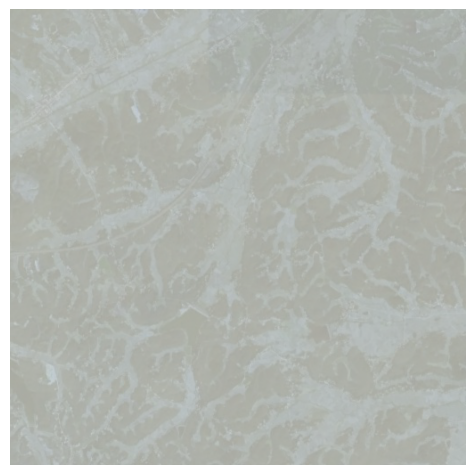

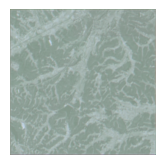

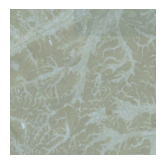

>Saved: plot_001500.png and model_001500.h5


In [25]:
dataset = tf_dataset(tg,tm,1)
print("Dataset loaded")
print(dataset)
#image_shape = 
image_shape = (512,512,3)
d_model = discriminator(image_shape)

g_model = Spa_gen(image_shape)


gan_model = call_GAN(g_model, d_model, image_shape)

train(d_model, g_model, gan_model, dataset, n_epochs=1500)

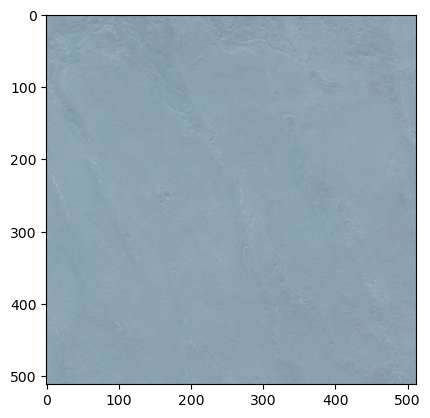

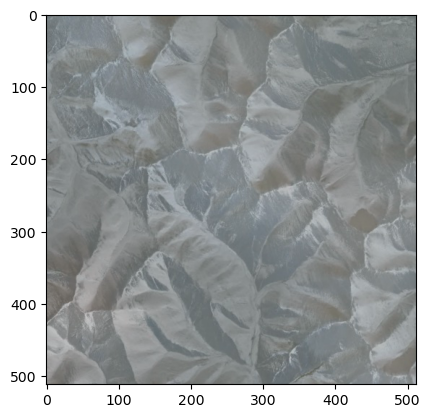

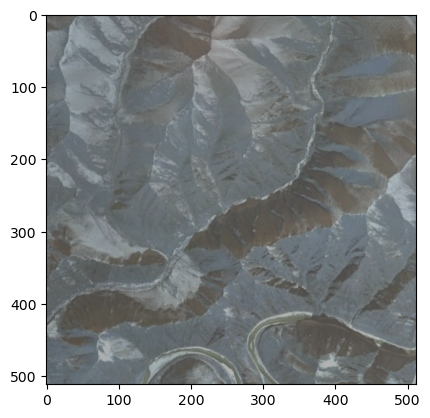

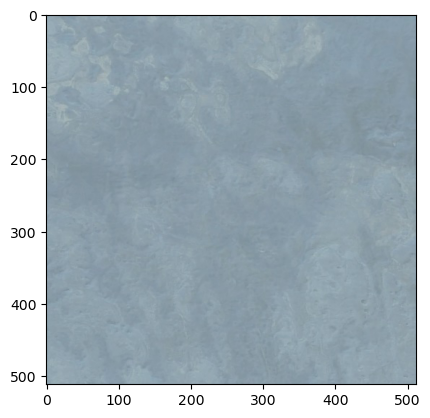

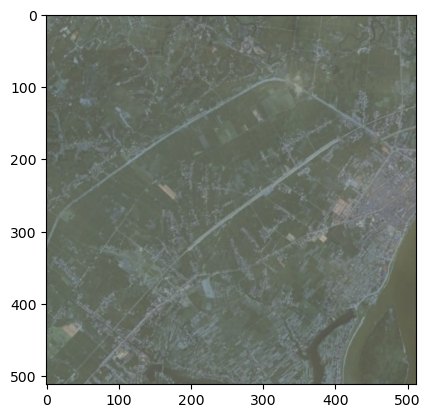

In [10]:
cloudypath = '/kaggle/input/spagaan/RICE_DATASET/RICE1/cloudy_image/'
testcd = [os.path.join(cloudypath,x) for x in testlist]
for i in testcd[15:20]:
    im = cv2.imread(i)
    plt.imshow(im)
    plt.show()

1/1 [==============================] - 2s 2s/step


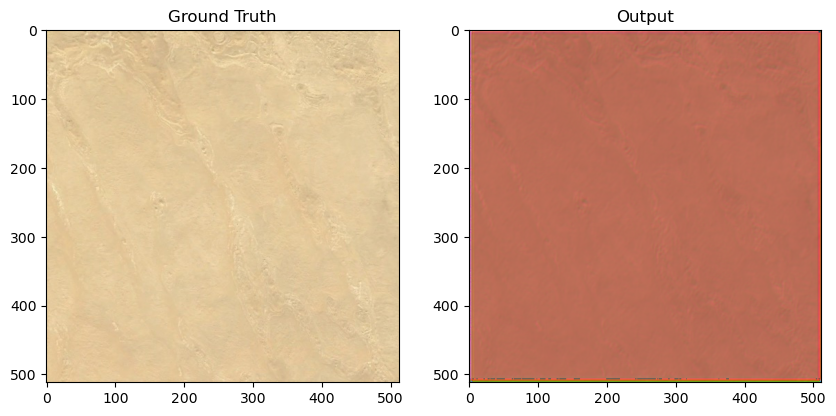

1/1 [==============================] - 2s 2s/step


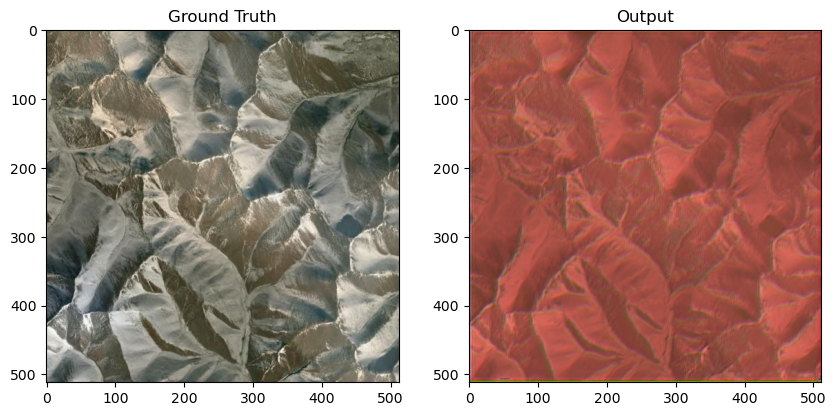

1/1 [==============================] - 2s 2s/step


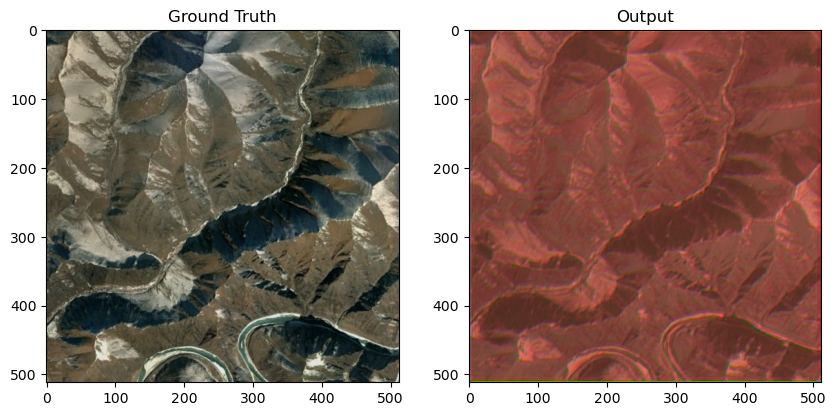

1/1 [==============================] - 2s 2s/step


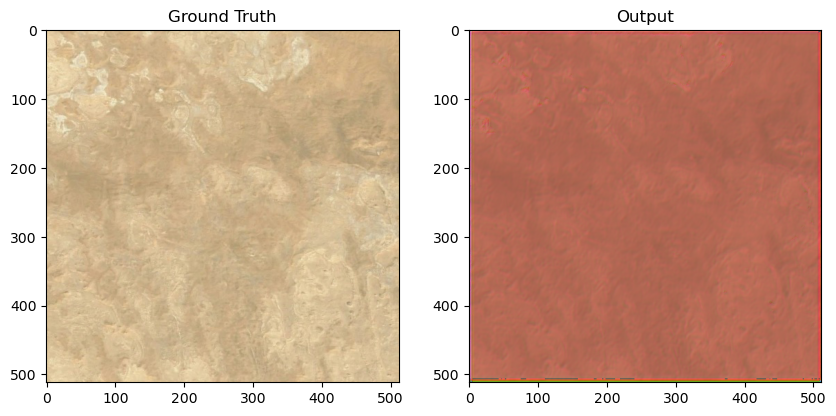

1/1 [==============================] - 2s 2s/step


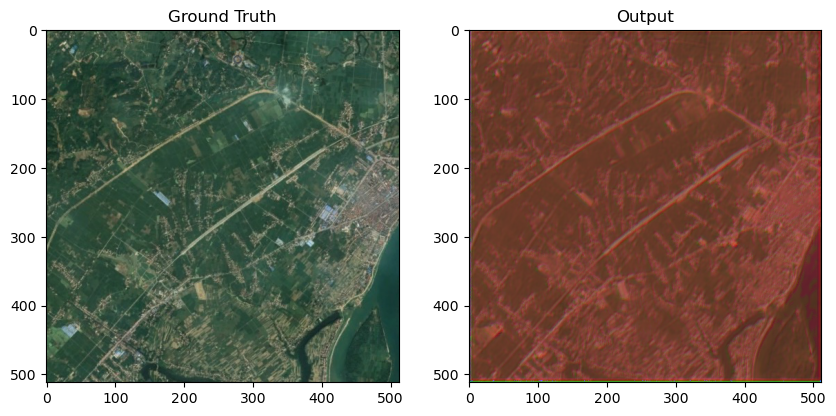

In [23]:
cloudypath = '/kaggle/input/spagaan/RICE_DATASET/RICE1/cloudy_image/'
testcd = [os.path.join(cloudypath,x) for x in testlist]
gt_path = '/kaggle/input/spagaan/RICE_DATASET/RICE1/ground_truth'

for i in testcd[15:20]:
    # Load the input image
    im = cv2.imread(i)
    im = (im+1)/2
    im = im[np.newaxis, :, :, :]
    
    # Load the ground truth image
    gt_name = os.path.basename(i)
    gt_path_i = os.path.join(gt_path, gt_name)
    gt_im = cv2.imread(gt_path_i)
    gt_im = cv2.cvtColor(gt_im, cv2.COLOR_BGR2RGB)
    
    # Load the model
    model_path = '/kaggle/input/model-epoch-900/model_000900.h5'
    g_model = tf.keras.models.load_model(model_path)
    
    # Use the model to make predictions                                
    ts = g_model.predict(im)
    ts = np.squeeze(ts)
    ts = ts.astype('uint8')
    ts = cv2.cvtColor(ts, cv2.COLOR_BGR2RGB)  # convert color space to RGB
    
    # Display the images side by side
    plt.figure(figsize=(10,5))
    plt.subplot(1,2,1)
    plt.imshow(gt_im)
    plt.title("Ground Truth")
    plt.subplot(1,2,2)
    plt.imshow(ts)
    plt.title("Output")
    plt.show()
